In [26]:
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [32]:
image = cv2.imread("/content/image.png")

In [28]:
def show(image):
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.axis("off")
  plt.show()

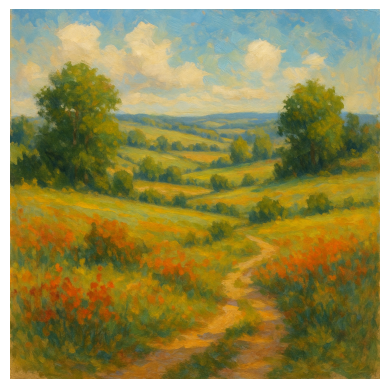

In [29]:
show(image)

In [11]:
def get_grayscale(image):
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  return image

In [51]:
def plot(image1, image2, title1="Original", title2="New"):
  fig, axes = plt.subplots(1,2,figsize=(14,8))
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
  axes[0].imshow(image1)
  axes[0].set_title(title1)
  axes[0].axis("off")
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
  axes[1].imshow(image2)
  axes[1].set_title(title2)
  axes[1].axis("off")
  plt.tight_layout()
  plt.show()

# Thresholding

It is a technique in which we compare pixel values to a threshold value and change them accordingly. It is mostly used to seperate foreground objects from the background.

Threshoding works on intensity, that's why we generally use grayscale images for this.


**Binary Thresholding**

If the pixel value is greater than the threshold, it is set to a max value otherwise it is set to 0.

In [16]:
def binary_threshold(image, threshold = 127, max_value = 255):
  threshold_value, threshold_image = cv2.threshold(image, threshold, max_value, cv2.THRESH_BINARY)
  # Similarly, we have cv2.THRESH_BINARY_INV which works opposite to binary
  # i.e. if the pixel value is greater than the threshold, it is set to 0 otherwise it is set to max value.
  return threshold_image


If we use a RBG image, binary thresholding applies threshold independently on each channel but this may not always work with other thresholding methods

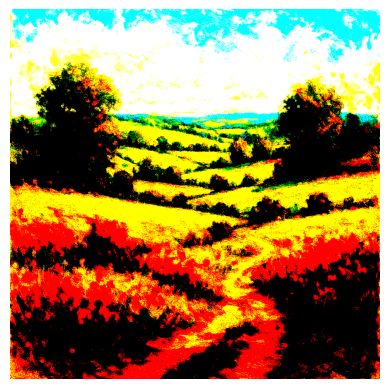

In [36]:
image_BTh = binary_threshold(image)
show(image_BTh)

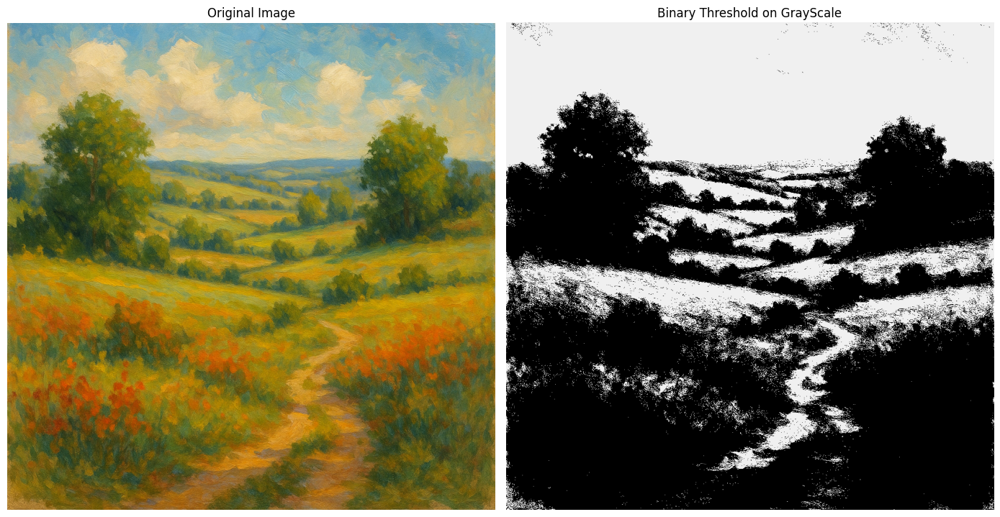

In [53]:
image_gray = get_grayscale(image)
image_BTh = binary_threshold(image_gray, 130, 240)
plot(image, image_BTh, "Original Image", "Binary Threshold on GrayScale")

**Adaptive Thresholding**

Threshold value for each pixel is determined individually based on a small region around it. Thus we get different thresholds for different regions of the image and so this method performs well on images with varying illumination.

In [54]:
# Adaptive Mean Thresholding
def Adaptive_Mean_Threshold(image, max_value = 255, blok_size = 11, C = 2):
    return cv2.adaptiveThreshold(image, max_value, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blok_size, C)

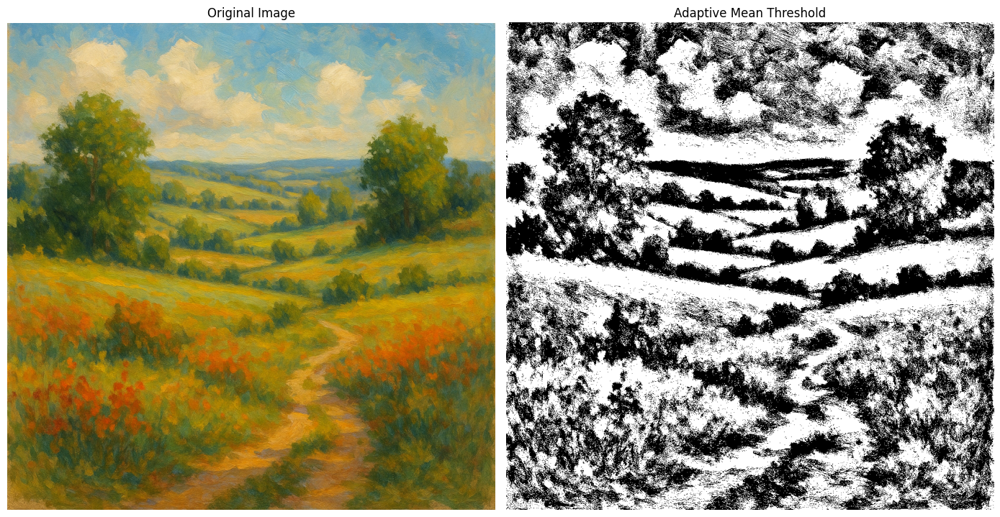

In [59]:
image_AMTh = Adaptive_Mean_Threshold(image_gray, 255, 99, 3) # Only possible for single channel mostly grayscale
plot(image, image_AMTh, "Original Image", "Adaptive Mean Threshold")

In [62]:
# Adaptive Gaussian Thresholding
def Adaptive_Gaussian_Threshold(image, max_value = 255, blok_size = 11, C = 2):
    return cv2.adaptiveThreshold(image, max_value, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blok_size, C)

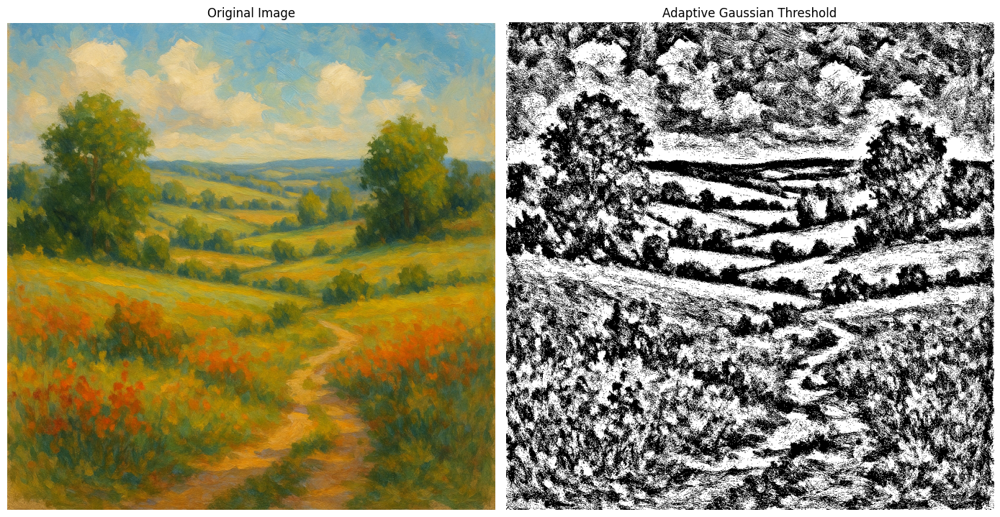

In [63]:
image_AGTh = Adaptive_Gaussian_Threshold(image_gray, 255, 115, 1) # Only possible for single channel mostly grayscale
plot(image, image_AGTh, "Original Image", "Adaptive Gaussian Threshold")

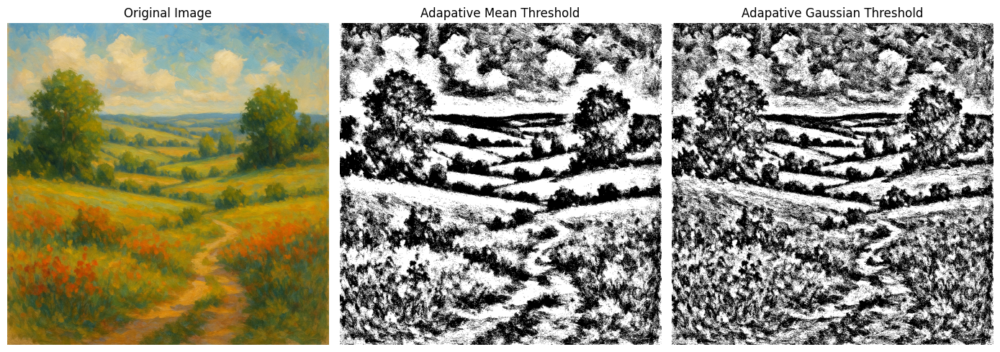

In [65]:
fig, axes = plt.subplots(1,3,figsize=(14,8))
image1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
axes[0].imshow(image1)
axes[0].set_title("Original Image")
axes[0].axis("off")
axes[1].imshow(image_AMTh, cmap = "gray")
axes[1].set_title("Adapative Mean Threshold")
axes[1].axis("off")
axes[2].imshow(image_AGTh, cmap = "gray")
axes[2].set_title("Adapative Gaussian Threshold")
axes[2].axis("off")
plt.tight_layout()
plt.show()

**Otsu Thresholding**

Using it means that OpenCV will decide an optimal threshold itself.

In [66]:
def otsu(image, threshold = 127, max_value = 255):
  threshold_value, threshold_image = cv2.threshold(image, threshold, max_value, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  # threshold is ignored when THRESH_OTSU is used but still it must be provided to avoid error
  return threshold_value, threshold_image

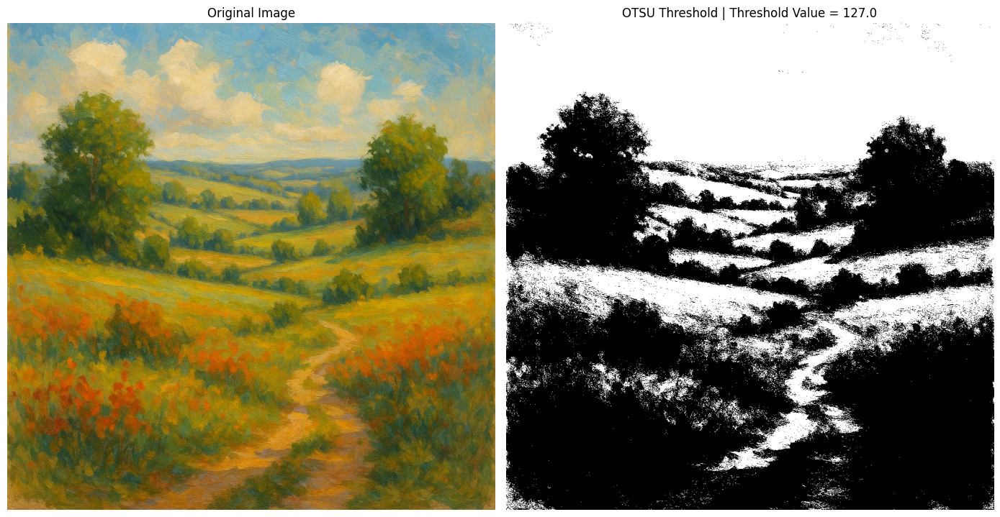

In [69]:
image_BTh = otsu(image_gray, 200, 255)[1] # OTSU also doesn't work for images with multiple channels
plot(image, image_BTh, "Original Image", f"OTSU Threshold | Threshold Value = {otsu(image_gray, 200, 255)[0]}")

# Morphological Transformation

It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation.

**1. Erosion** - It shrinks the white regions by eroding away the boundaries of the foreground objects.

In [73]:
img = cv2.imread("/content/download (1).jpeg")

In [75]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [70]:
def erode(image, kernel = (5,5), iterations = 1):
  return cv2.erode(image, np.ones(kernel, np.uint8), iterations)

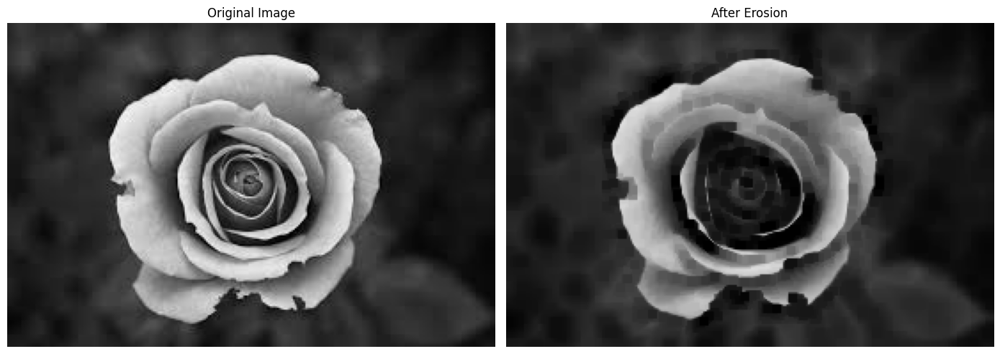

In [103]:
eroded = erode(img)
plot(img, eroded, "Original Image", "After Erosion")

Increasing iterations will:

1. Erode more aggressively

2. Remove more white pixels from object boundaries

3. Make shapes thinner or even disappear completely if small

**2. Dilation** - Dilation is the opposite of erosion.
Instead of shrinking white regions (like erosion does), dilation expands them.

In a binary image :

For each black pixel (0), if any neighboring pixel (defined by a kernel) is white (255), the black pixel becomes white.

In [86]:
def dilation(image, kernel = (5,5), iterations = 1):
  return cv2.dilate(image, np.ones(kernel, np.uint8), iterations)

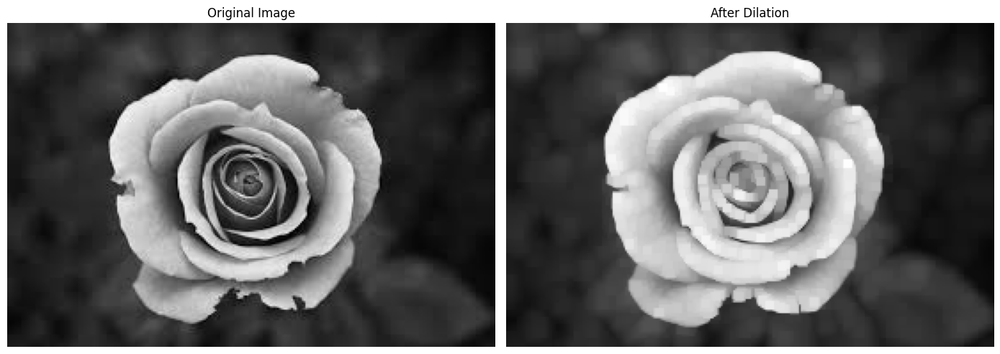

In [88]:
dilated = dilation(img)
plot(img, dilated, "Original Image", "After Dilation")

Each additional iteration expands white regions more.

Thin objects get thicker.

Small gaps or holes in shapes may disappear.

**3. Opening** - Erosion followed by dilation

In [89]:
def opening(image, kernel=(5, 5)):
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel=np.ones(kernel, np.uint8))

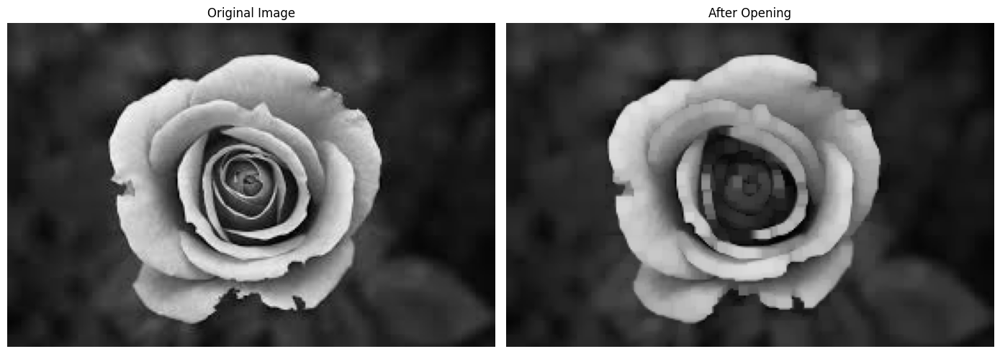

In [91]:
img_open = opening(img)
plot(img, img_open, "Original Image", "After Opening")

**4. Closing** - Dilation followed by erosion

 It is useful in closing small holes inside the foreground objects, or small black points on the object.

In [94]:
def closing(image, kernel = (5,5)):
  return cv2.morphologyEx(image, cv2.MORPH_CLOSE, np.ones(kernel, np.uint8))

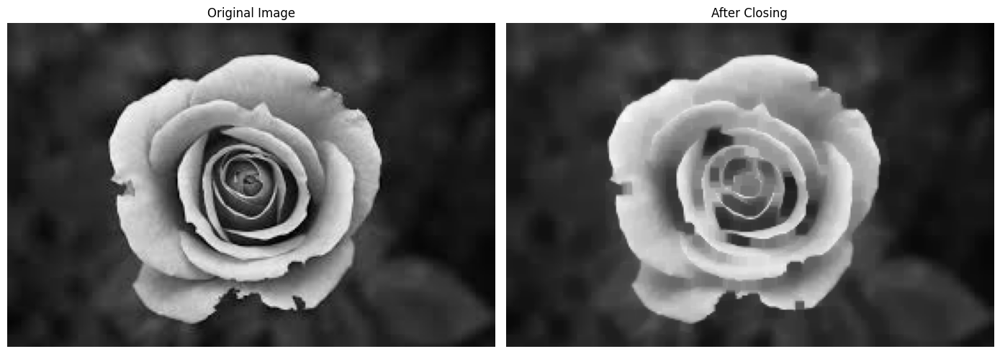

In [95]:
img_close = closing(img)
plot(img, img_close, "Original Image", "After Closing")

**5. Gradient** - Difference between dilation and erosion of an image

In [96]:
def morphological_gradient(image, kernel=(2, 2)):
    return cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel=np.ones((2, 2), np.uint8))

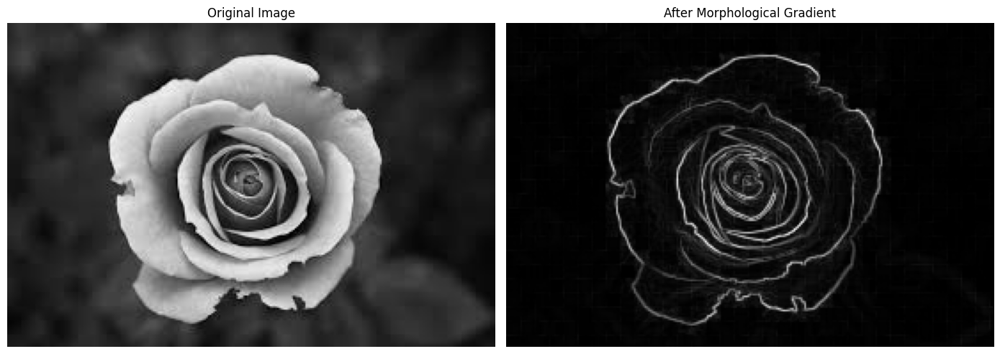

In [97]:
img_grad = morphological_gradient(img, (5,5))
plot(img, img_grad, "Original Image", "After Morphological Gradient")

**6. Top Hat** - Difference between input image and opening of input image

In [98]:
def top_hat(image, kernel = (5,5)):
  return cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel)

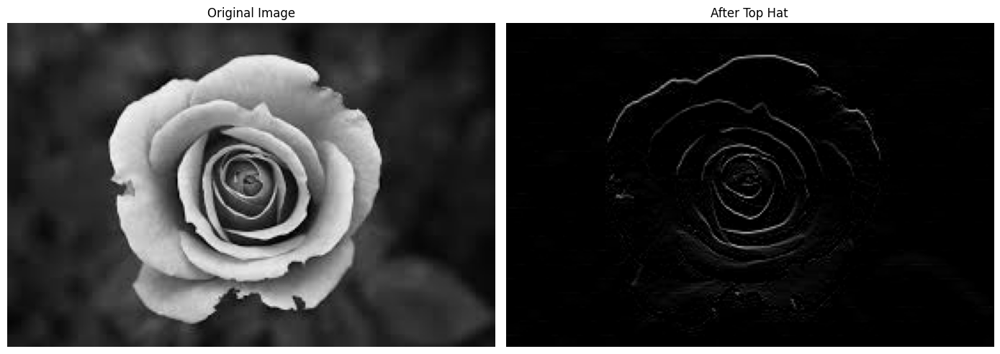

In [99]:
img_topHat = top_hat(img)
plot(img, img_topHat, "Original Image", "After Top Hat")

**7. Black Hat** - Difference between the closing of the input image and input image

In [100]:
def black_hat(image, kernel = (5,5)):
  return cv2.morphologyEx(image, cv2.MORPH_BLACKHAT, kernel)

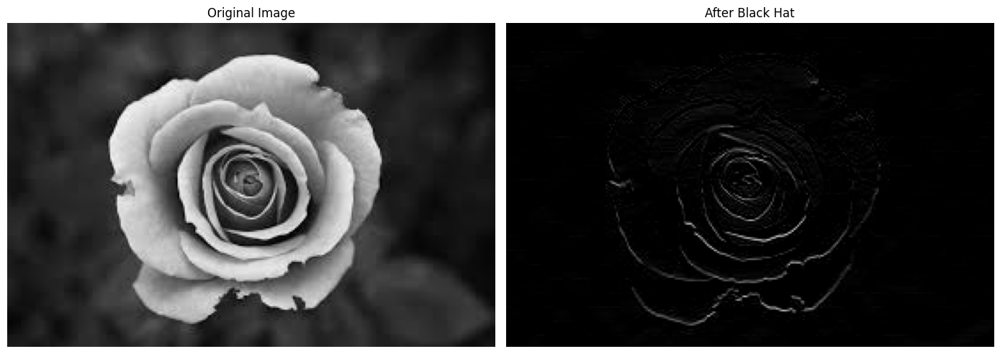

In [101]:
img_blackHat = black_hat(img)
plot(img, img_blackHat, "Original Image", "After Black Hat")

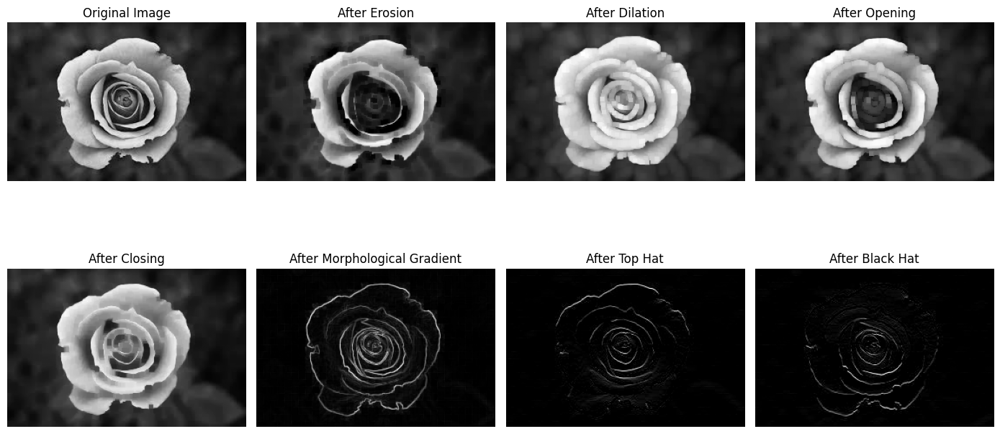

In [104]:
fig, axes = plt.subplots(2,4,figsize=(14,8))
axes[0, 0].imshow(img, cmap = "gray")
axes[0, 0].set_title("Original Image")
axes[0, 0].axis("off")
axes[0, 1].imshow(eroded, cmap = "gray")
axes[0, 1].set_title("After Erosion")
axes[0, 1].axis("off")
axes[0, 2].imshow(dilated, cmap = "gray")
axes[0, 2].set_title("After Dilation")
axes[0, 2].axis("off")
axes[0, 3].imshow(img_open, cmap = "gray")
axes[0, 3].set_title("After Opening")
axes[0, 3].axis("off")
axes[1, 0].imshow(img_close, cmap = "gray")
axes[1, 0].set_title("After Closing")
axes[1, 0].axis("off")
axes[1, 1].imshow(img_grad, cmap = "gray")
axes[1, 1].set_title("After Morphological Gradient")
axes[1, 1].axis("off")
axes[1, 2].imshow(img_topHat, cmap = "gray")
axes[1, 2].set_title("After Top Hat")
axes[1, 2].axis("off")
axes[1, 3].imshow(img_blackHat, cmap = "gray")
axes[1, 3].set_title("After Black Hat")
axes[1, 3].axis("off")
plt.tight_layout()
plt.show()

# Edge Detection

Edges are where pixel intensities change. The gradient of a function outputs the rate of change. We can approximate the gradient of a grayscale image with convolution. There are several methods to approximate the gradient, but we will use the Sobel edge detector

In [126]:
newImage = cv2.imread("/content/DetectEdgesInImagesExample_01.png")

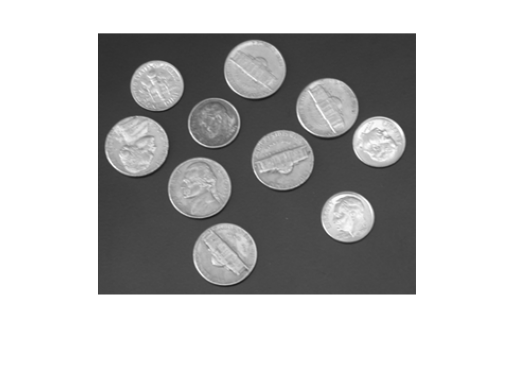

In [127]:
show(newImage)

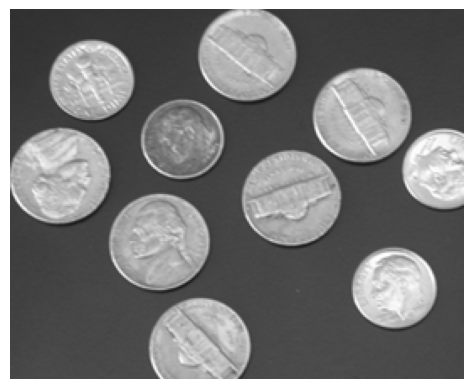

In [133]:
new = newImage[30:250,90:360]
show(new)

**Laplacian Edge Detection**

Laplacian operator is a second-order derivative operator used to detect edges based on intensity changes especially where the gradient changes rapidly

In [118]:
def laplacian(image, k = 3):
  return np.uint8(np.absolute(cv2.Laplacian(image, cv2.CV_64F, ksize=k)))

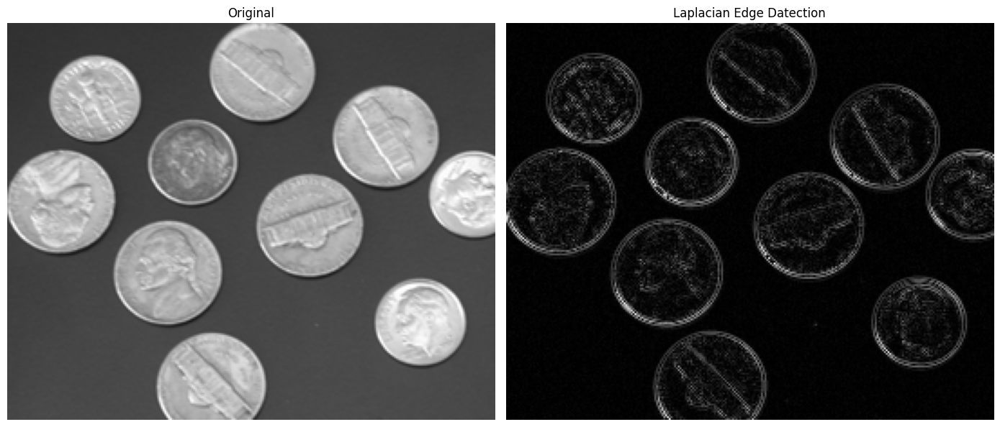

In [135]:
laplacian_edge = laplacian(new, 1)
plot(new, laplacian_edge, "Original", "Laplacian Edge Datection")

**Canny Edge Detection**

It is a multi-stage edge detection algorithm that finds strong and weak edges using gradients.

threshold1 : Lower bound for edge detection (edge candidate)

threshold2 : Upper bound (definitely an edge)

apertureSize : Size of Sobel Kernels (odd values)

In [124]:
def canny(image, th1=100, th2=200, apertureSize=3):
    return cv2.Canny(image, threshold1=th1, threshold2=th2, apertureSize=apertureSize)

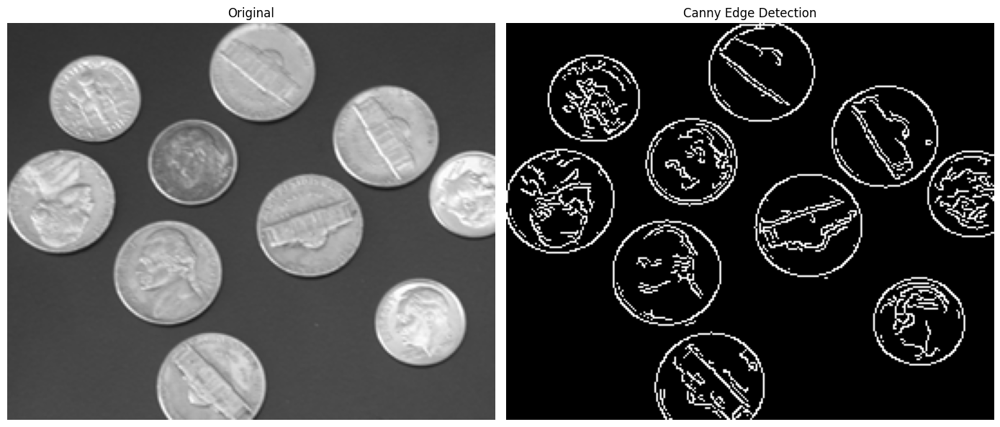

In [136]:
canny_edge = canny(new)
plot(new, canny_edge, "Original", "Canny Edge Detection")

Since the Laplacian uses second derivatives, it's sensitive to noise. So blurring before applying it is highly recommended.

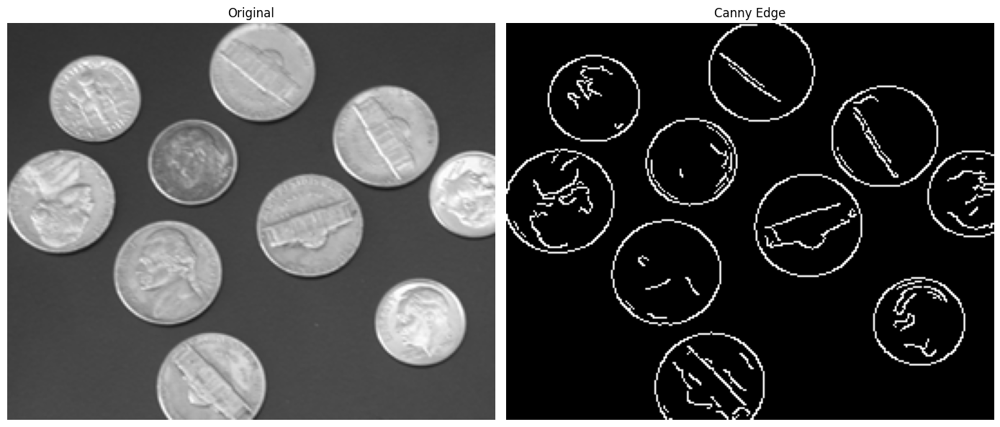

In [147]:
# Pre-processing before Edge Detection
gray=get_grayscale(new)
blurred=cv2.medianBlur(gray,3) # We can also apply morphological transformations when needed
image_canny=canny(blurred)
plot(new, image_canny, "Original", "Canny Edge")

In [153]:
def sobel(image):
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  vertical = np.uint8(np.absolute(cv2.Sobel(image,cv2.CV_64F, dx = 1, dy = 0, ksize=1)))
  horizontal = np.uint8(np.absolute(cv2.Sobel(image,cv2.CV_64F, dx = 0, dy = 1, ksize=1)))
  Sobel = cv2.bitwise_or(vertical, horizontal)
  return horizontal, vertical, Sobel

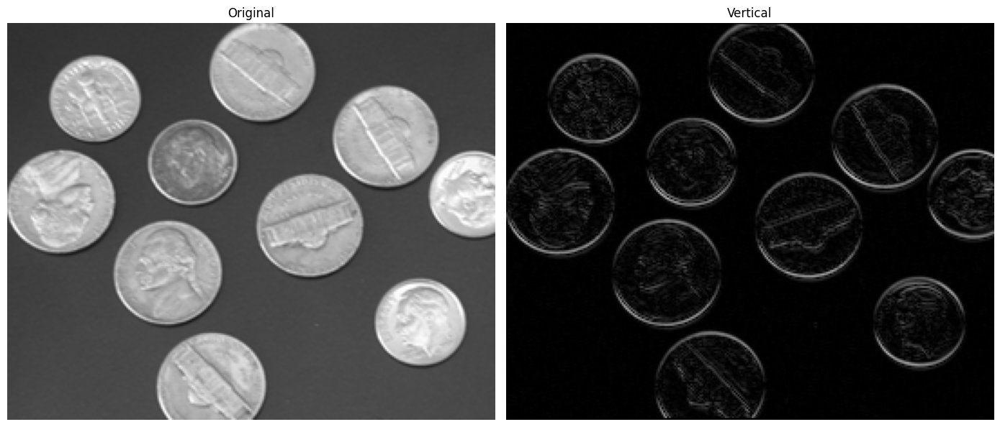

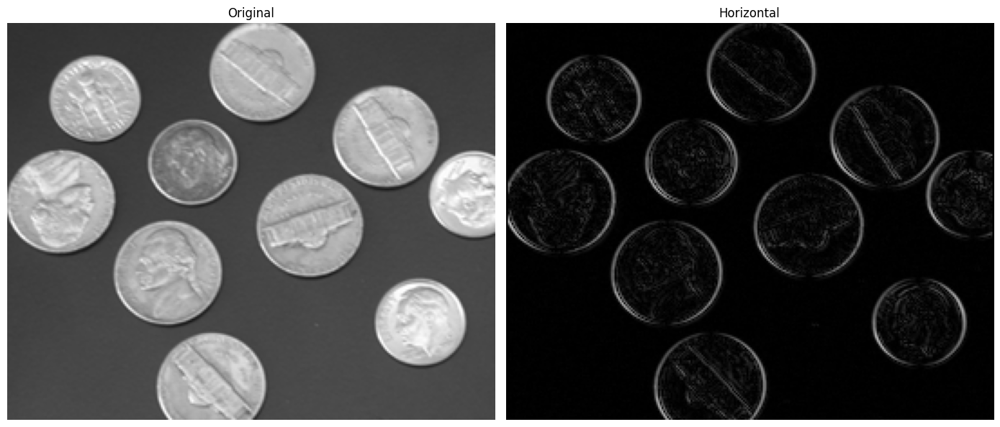

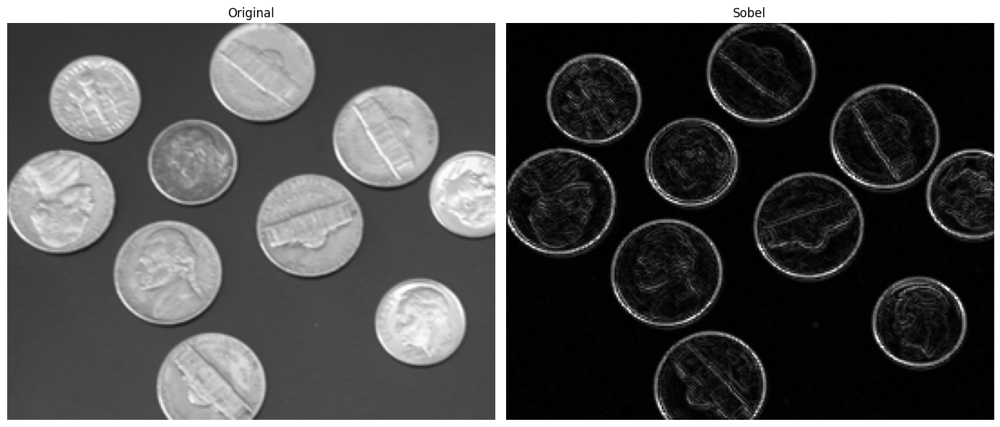

In [154]:
vert, hor, Sobel = sobel(gray)
plot(new, vert, "Original", "Vertical")
plot(new, hor, "Original", "Horizontal")
plot(new, Sobel, "Original", "Sobel")

# Transformation

In [210]:
blurred=cv2.medianBlur(newImage,7)

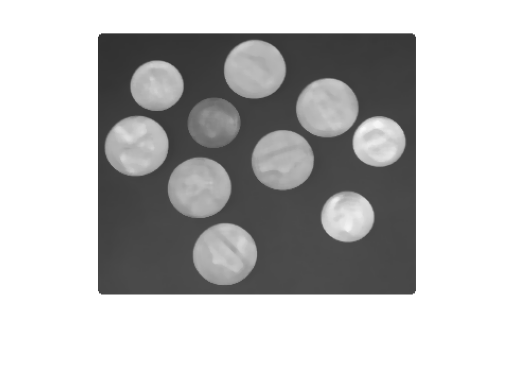

In [211]:
show(blurred)

In [212]:
def detect_light_region(blurred_image, kernel = (7,7)):
  sqrKernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel)
  dilated = cv2.dilate(blurred_image, sqrKernel)
  edge = canny(dilated)
  show(edge)
  return edge

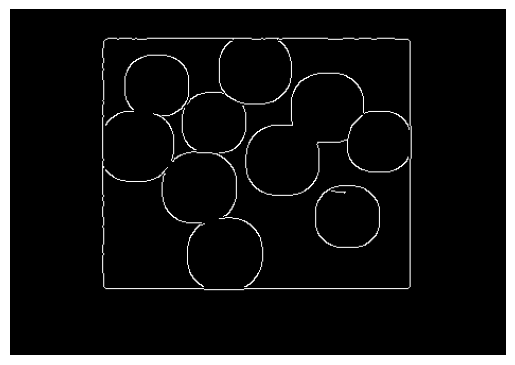

In [213]:
edge = detect_light_region(blurred, (11,11))

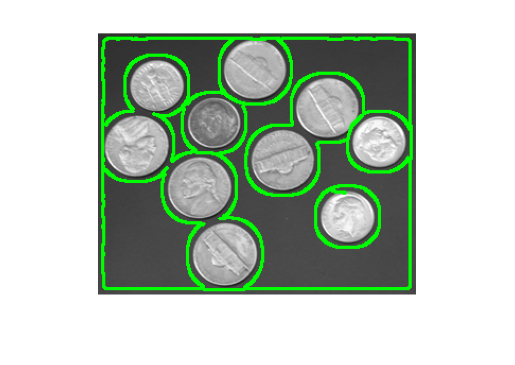

In [215]:
contours, hierarchy = cv2.findContours(edge, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
image_with_contours = cv2.drawContours(newImage.copy(), contours, -1, (0,255,0), 2)
show(image_with_contours)

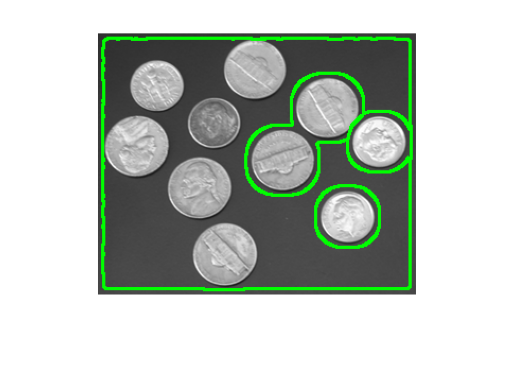

In [218]:
# Getting 5 largest contours (curve joining all the continuous points along a boundary that have the same color or intensity)
largest_contours = sorted(contours, key = cv2.contourArea, reverse = True)[:5]
image_with_largest_contours = cv2.drawContours(newImage.copy(), largest_contours, -1, (0,255,0), 2)
show(image_with_largest_contours)

In [219]:
def approximate_contour(contour):
  perimeter = cv2.arcLength(contour, True)
  approximatedShape = cv2.approxPolyDP(contour, 0.032 * perimeter, True)
  return approximatedShape

In [220]:
def contour_4(contours):
  for contour in contours:
    polygon_shape=approximate_contour(contour)
    if len(polygon_shape)==4:
      return polygon_shape

In [221]:
rec_contour=contour_4(largest_contours)
print(rec_contour)

[[[ 88  30]]

 [[ 90 263]]

 [[377 261]]

 [[375  28]]]


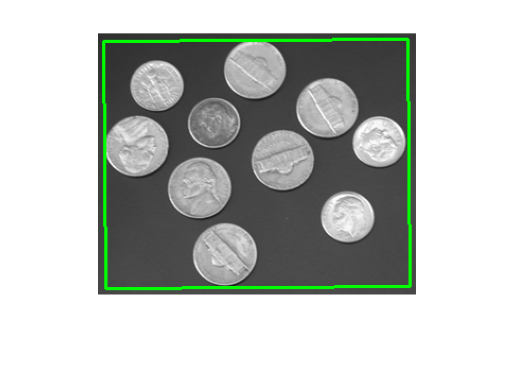

In [222]:
image_with_rec_contour = cv2.drawContours(newImage.copy(), [rec_contour], -1, (0, 255, 0), 2)
show(image_with_rec_contour)

In [226]:
def rect(contour):
  pts = contour.reshape(4,2)
  rect = np.zeros_like(pts, dtype="float32")
  s = pts.sum(axis = 1)
  rect[0] = pts[np.argmin(s)]
  rect[2] = pts[np.argmax(s)]
  diff = np.diff(pts, axis=1)
  rect[1] = pts[np.argmin(diff)]
  rect[3] = pts[np.argmax(diff)]
  return rect

In [227]:
rec = rect(rec_contour)
print(rec)

[[ 88.  30.]
 [375.  28.]
 [377. 261.]
 [ 90. 263.]]


In [228]:
def warp_prespective(original_image, rect):
  (tl, tr, br, bl) = rect
  widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
  widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
  heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
  heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
  # take the maximum of the width and height values to reach our final dimensions
  maxWidth = max(int(widthA), int(widthB))
  maxHeight = max(int(heightA), int(heightB))
  # construct our destination points which will be used to map the screen to a top-down, "birds eye" view
  dst = np.array([
      [0, 0],
      [maxWidth - 1, 0],
      [maxWidth - 1, maxHeight - 1],
      [0, maxHeight - 1]], dtype = "float32")
  # calculate the perspective transform matrix and warp the perspective to grab the screen
  M = cv2.getPerspectiveTransform(rect, dst)
  warp = cv2.warpPerspective(original_image.copy(), M, (maxWidth, maxHeight))
  return warp

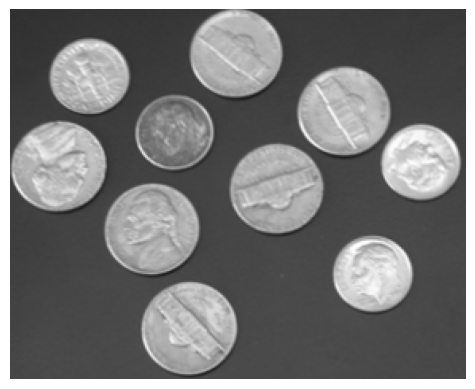

In [229]:
warp=warp_prespective(newImage, rec)
show(warp)